### 1. required libraries

In [ ]:
import numpy as np
from numpy import asarray
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import cm # color map
import seaborn as sns

import os.path
from os import path

from google.colab import files

import matplotlib.pyplot as plt
import cv2 as cv
import cv2

# Import the necessary libraries
from PIL import Image
from skimage.io import imread



###2. load the dataset from the kaggle

In [ ]:
# refernce how to load the dataset from the kaggle
# refer: https://www.analyticsvidhya.com/blog/2021/06/how-to-load-kaggle-datasets-directly-into-google-colab/


In [ ]:
# load the json file from thee device
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"kancharlasairam","key":"6e753fde060715f5f40c889675ec7e5c"}'}

In [ ]:
def load_dataset():
  """
    this function is used to load the dataset based on my required format and folder.
  """
  if path.exists("/content/agriculture-crop-images.zip"):
    print("loaded the dataset...")
  else:
    ! pip install -q kaggle # install the kaggle library
    ! mkdir ~/.kaggle # create root directory
    ! cp kaggle.json ~/.kaggle/ #  Make directory named kaggle and copy kaggle.json file there.

    ! chmod 600 ~/.kaggle/kaggle.json # Change the permissions of the file.
    ! kaggle datasets download -d aman2000jaiswal/agriculture-crop-images # download the dataset with -d / competition with -c
  
  # for my comfort create the kaggle/input directory to unzip the files.

  if path.isdir('/kaggle/input'):  # check if the /kaggle/input exists or not?
  # if the folder is created already.
    if path.exists("/kaggle/input/Crop_details.csv"): # /content/kaggle/input/Crop_details.csv
      print("already existed and loaded...")
    else:
      # unzip the dataset
      # unzip the list of data from the drive list files
      # refer code: !unzip path_to_file.zip -d path_to_directory(destination)  
      print("unzip the dataset....")
      ! unzip /content/agriculture-crop-images.zip -d /kaggle/input
  else: # if the /kaggle/input is not created then create the folders.

      # create kaggle directory for my comfort
      ! mkdir /kaggle
      ! mkdir /kaggle/input
      # unzip the dataset
      print("unzip the dataset ....")
      ! unzip /content/agriculture-crop-images.zip -d /kaggle/input  # unzip the folder into the destination where you required.
  
  return None

In [ ]:
load_dataset() # loaded the dataset 

In [ ]:
load_dataset() # cross check once you loaded the dataset . 

loaded the dataset...
already existed and loaded...


In [ ]:
# cross check the folders and files
path.isdir('/kaggle')
path.exists("/kaggle/input/Crop_details.csv")
path.exists("/kaggle/input/crop_images/jute/jute002a.jpeg")

True

In [ ]:
path.exists("/kaggle/input/crop_images/wheat/wheat0002a.jpeg")

True

###3. EDA(exploratory data analysis)

In [ ]:
# 3.sugarcane = 0---20
# 4.wheat = 159---170
# 5.jute = 321----330
# 1.maize = 480....490
# 2.rice = 639 --- 650.

In [ ]:
# load the cropdetails file that contains the 3 columns image path and crop name and crop label. we don't need Unnamed column so drop that.
df = pd.read_csv("/kaggle/input/Crop_details.csv",index_col=None).drop("Unnamed: 0",axis=1)
df.head(3)

,path,crop,croplabel
0,/kaggle/input/kag2/sugarcane/sugarcane037ahs.jpeg,sugarcane,3
1,/kaggle/input/kag2/sugarcane/sugarcane034a.jpeg,sugarcane,3
2,/kaggle/input/kag2/sugarcane/sugarcane032arot....,sugarcane,3


<pre>
#observation:
1. path column represents the path of the stored image in the notebook
2. crop column represents the label of the stored image.
3. croplabel represents the label of the given crop
4. maize-1 , rice-2 , sugarcane-3 , wheat-4 , jute-5.
</pre>

#### 3.1 dataset analysis

In [ ]:
def dataset_analysis(dataframe):
  """
  this function takes the dataframe as input  and it gives the no of images of the each label.
  and display the some sample images of the each crop type.
  """
  #refernce to arrange multiple images
  # refer: https://www.geeksforgeeks.org/how-to-display-multiple-images-in-one-figure-correctly-in-matplotlib/
  
  crops_list = ["wheat","sugarcane","jute","maize","rice"]
  # create list of the crop names I have crop images.

  for i in crops_list: # iterate through the crops list.
    data_crop = dataframe[dataframe["crop"]==i] # extract the required crop data from the given dataframe.
    print("{1} of images of the {0} crop in our dataset.".format(i,len(data_crop))) # how many images I have for each crop.
    figr = plt.figure(figsize=(30,30)) # width,height of the figure.
    # setting rows and columns
    rows=1
    columns=10
    for imageno,imagepath in enumerate(data_crop["path"][10:20]): # takes the 10 rows of the given crop data.
      #print(ipath)
      image = cv.imread(imagepath)
      figr.add_subplot(rows,columns,imageno+1)
      plt.imshow(image)
      plt.axis("off") # it turn off the axis dimensions
      plt.title("{}".format(i)) # corresponding crop name as the title.
  return None

203 of images of the wheat crop in our dataset.
199 of images of the sugarcane crop in our dataset.
199 of images of the jute crop in our dataset.
199 of images of the maize crop in our dataset.
199 of images of the rice crop in our dataset.


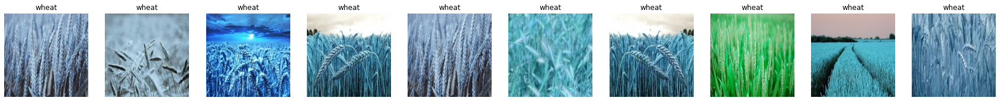

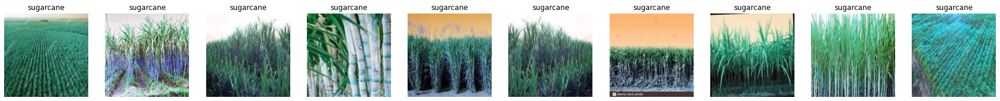

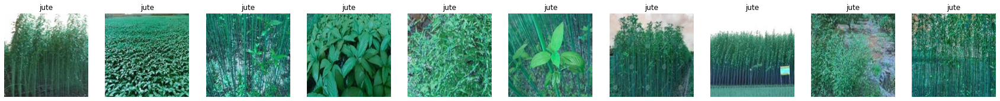

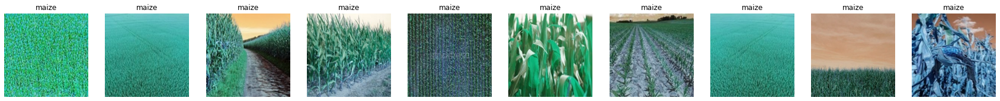

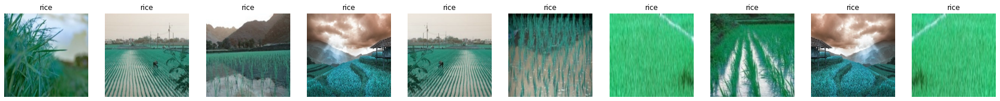

In [ ]:
dataset_analysis(df)

<pre>
observation:
1. it gives the different types of the images of the corresponding crop .
2. here I displayed 10 images of the each crop.
3. given dataset is balanced.
</pre>

#### 3.2 target analysis

In [ ]:
def target_column_analysis(df,col):
  """ this function to analyze the  column on given dataframe"""
  plt.figure(figsize=(15,5))
  plt.subplot(1,2,1)
  """
    The pie chart is also the same as the countplot, 
    only gives you additional information about the percentage presence of each category in data 
    means which category is getting how much weightage in data.
  """
  df[col][:].value_counts().plot.pie(autopct="%1.2f%%",shadow=True)

  plt.title("%contribution of {0} ".format(col),fontweight = 'bold',fontsize=14, color = 'brown')

  plt.subplot(1,2,2)
  """
     Countplot is basically a count of frequency plot in form of a bar graph. 
     It plots the count of each category in a separate bar. 
     When we use the pd value counts function on any column, 
     It is the same visual form of the value counts function.
  """
  
  sns.countplot(x=df[col][:])
  plt.title("#of values in {0}".format(col),fontweight = 'bold',fontsize=14, color = 'brown')
  plt.show()

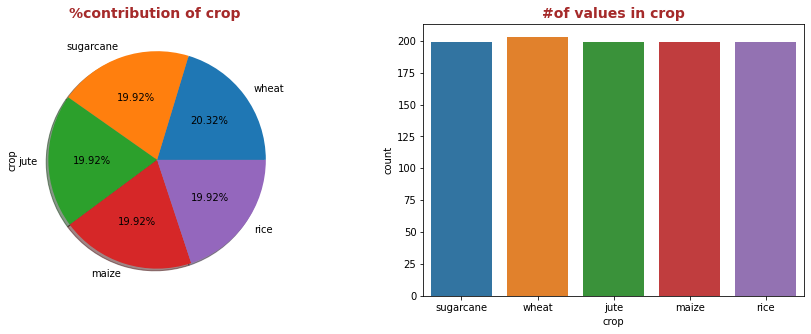

In [ ]:
target_column_analysis(df,"crop") # dataframe , column name.

<pre>
observation:
1. In the given dataset "crop" is the target column to classify.
2. 203 of images of the wheat crop in our dataset.
3. 199 of images of the sugarcane crop in our dataset.
4. 199 of images of the jute crop in our dataset.
5. 199 of images of the maize crop in our dataset.
6. 199 of images of the rice crop in our dataset.
</pre>

####3.3 crop image analysis

In [ ]:
# just load the individual crop data for my future analysis

# jute data
df_jute = df[df['croplabel']==0][["path","crop"]]
df_jute.head(3)

#maize data
df_maize = df[df["croplabel"]==1][["path","crop"]]
df_maize.head(3)

# rice data
df_rice = df[df["croplabel"]==2][["path","crop"]]
df_rice.head(3)

# sugarcane data
df_sugarcane = df[df["croplabel"]==3][["path","crop"]]
df_sugarcane.head(3)

# wheat data
df_wheat = df[df["croplabel"]==4][["path","crop"]]
df_wheat.head(3)

,path,crop
159,/kaggle/input/kag2/wheat/wheat0004a.jpeg,wheat
160,/kaggle/input/kag2/wheat/wheat017a.jpeg,wheat
161,/kaggle/input/kag2/wheat/wheat004a.jpeg,wheat


##### required manual functions

In [ ]:
def image_analysis(image_path,crop_name):
  """
  This function takes imagepath and cropname as input and gives the basic image analysis

  """
  im = Image.open(image_path)
  print(" summarize the basic details of the image...")
  print("="*50)
  print("The format of the image : ",im.format)
  print("The size of the image : ",im.size)
  print("The mode of the image : ",im.mode)

  print(crop_name.upper().center(200,"-"))
  pic = cv.imread(image_path)
  plt.figure(figsize=(5,10))
  plt.imshow(pic)
  plt.show()

  # basic properties of the image
  print('Type of the image : ',type(pic))
  print('Shape of the given image : {}'.format(pic.shape))
  print('Image Hight {}'.format(pic.shape[0]))
  print('Image Width {}'.format(pic.shape[1]))
  print('Dimension of Image {}'.format(pic.ndim))
  # The shape of the ndarray is a three layered matrix. The first two numbers here are length and width, and the third number (i.e. 3) is for the three layers: Red, Green, Blue. 
  # So, if we calculate the size of a RGB image, the total size will be counted as height x width x 3

  print('Image size(ht*width*#of channels) : {}'.format(pic.size))

  print('Maximum RGB value in this image : {} '.format(pic.max()))

  print('Minimum RGB value in this image : {} '.format(pic.min()))

  return None


In [ ]:
def image_pixel_analysis(image_path,crop_name,row_val,col_val):
  """
    This function takes the image path , crop name and some pixel of height and width gives the  what is the intensity values at those values.
    gives the how the channels are designed and hw they distributed .
    0index value for Red channel
    1index value for Green channel
    2index value for Blue channel
    
  """

  print(crop_name.upper().center(200,"-"))
  pic = cv.imread(image_path)
  
  # A specific pixel located at Row : 100 ; Column : 50 

  # Each channel's value of it, gradually R , G , B
  print("pixel values at {0} row and {1} column.".format(row_val,col_val))
  print('Value of only R channel {}'.format(pic[row_val, col_val, 0])) # channel-0

  print('Value of only G channel {}'.format(pic[row_val,col_val, 1])) # channel-1

  print('Value of only B channel {}'.format(pic[row_val,col_val, 2])) # channel-2

  figr = plt.figure(figsize=(30,10))
  rows = 1
  columns = 4
  #subplot1
  figr.add_subplot(rows,columns,1)
  plt.title("RGB image",fontweight = 'bold',fontsize=14, color = 'Brown')
  plt.ylabel('{} pxl Height'.format(pic.shape[0]))
  plt.xlabel('{} pxl Width'.format(pic.shape[1]))
  plt.imshow(pic)

  # subplot2
  figr.add_subplot(rows,columns,2) 
  plt.title('Red channel',fontweight = 'bold',fontsize=14, color = 'red')
  plt.ylabel('{} pxl Height'.format(pic.shape[0]))
  plt.xlabel('{} pxl Width'.format(pic.shape[1]))
  plt.imshow(pic[ : , : , 0]) # height range , width range , channel no

  # subplot3
  figr.add_subplot(rows,columns,3)
  plt.title('Green channel',fontweight = 'bold',fontsize=14, color = 'green')
  plt.ylabel('{} pxl Height'.format(pic.shape[0]))
  plt.xlabel('{} pxl Width'.format(pic.shape[1]))
  plt.imshow(pic[ : , : , 1]) # height range , width range ,channel no.

  # subplot4
  figr.add_subplot(rows,columns,4)
  plt.title('Blue channel',fontweight = 'bold',fontsize=14, color = 'blue')
  plt.ylabel('{} pxl Height'.format(pic.shape[0])) # height
  plt.xlabel('{} pxl Width'.format(pic.shape[1]))  # width
  plt.imshow(pic[ : , : , 2]) # height range , width range , channel no
  plt.show()


  figr2 = plt.figure(figsize=(30,5))
  
  #subplot 1
  # tuple to select colors of each channel line
  figr2.add_subplot(rows,columns,1)
  colors = ("red", "green", "blue")
  channel_ids = (0, 1, 2)

  # create the histogram plot, with three lines, one for
  # each color
  figr2.add_subplot(rows,columns,1)
  for channel_id, colr in zip(channel_ids, colors): # iterate through the colors and channel id's.
    histogram, bin_edges = np.histogram(pic[:, :, channel_id], bins=256, range=(0, 256))
    plt.plot(bin_edges[0:-1], histogram, color=colr)
  
  plt.title("Color Histogram")
  plt.xlabel("Color value")
  plt.xlim([0, 256])
  plt.ylabel("Pixel count")
  

  # subplot2
  figr2.add_subplot(rows,columns,2)
  hist1,bin1 = np.histogram(pic[:,:,0],bins=256,range=(0,255+1))
  plt.plot(bin1[0:-1],hist1,color="red")
  plt.title("red Color Histogram")
  plt.xlabel("Color value")
  plt.xlim([0, 256])
  plt.ylabel("Pixel count")


  # subplot3
  figr2.add_subplot(rows,columns,3)
  hist2,bin2 = np.histogram(pic[:,:,1],bins=256,range=(0,255+1))
  plt.plot(bin2[0:-1],hist2,color="Green")
  plt.title("Green color Histogram")
  plt.xlabel("Color value")
  plt.xlim([0, 256])
  plt.ylabel("Pixel count")
  #plt.show()

  # subplot2
  figr2.add_subplot(rows,columns,4)
  hist3,bin3 = np.histogram(pic[:,:,2],bins=256,range=(0,255+1))
  plt.plot(bin3[0:-1],hist3,color="Blue")
  plt.title(" Blue Color Histogram")
  plt.xlabel("Color value")
  plt.xlim([0, 256])
  plt.ylabel("Pixel count")
  plt.show()


  # print(pic)


In [ ]:
def transformations_image(image_path,crop_name):
  print(crop_name.upper().center(200,"-")) # Required. The length of the returned string , The character to fill the missing space on each side. Default is " " (space)

  # reference link for different transformations : https://www.kdnuggets.com/2018/09/image-data-analysis-python-p3.html
  """
     this function is takes the image path ass the input and gives the how the image appeared with different trasformations.
  """

  figr = plt.figure(figsize=(25,10)) # imgwidth,imgheight
  rows =1
  columns = 5
  pic1 = cv.imread(image_path) # read the image into array format
  print("shape of the given image : ",pic1.shape)
  # subplot1
  figr.add_subplot(rows,columns,1)
  plt.title("general image",fontweight = 'bold',fontsize=14, color = 'orange')
  plt.imshow(pic1)
  plt.ylabel('{} pxl Height'.format(pic1.shape[0])) # height
  plt.xlabel('{} pxl Width'.format(pic1.shape[1]))  # width
  #plt.xlabel("image width")
  #plt.ylabel("image height")

  # subplot2
  figr.add_subplot(rows,columns,2)
  plt.title("Normalized image",fontweight = 'bold',fontsize=14, color = 'orange')
  pic11 = (pic1/255)
  plt.imshow(pic11)
  plt.ylabel('{} pxl Height'.format(pic11.shape[0])) # height
  plt.xlabel('{} pxl Width'.format(pic11.shape[1]))  # width
  
  # subplot2 

  pic2 =255- pic1 # neg = (L-1) - img
  figr.add_subplot(rows,columns,3)
  plt.title("negative image",fontweight = 'bold',fontsize=14, color = 'orange')
  plt.imshow(pic2)
  plt.ylabel('{} pxl Height'.format(pic2.shape[0])) # height
  plt.xlabel('{} pxl Width'.format(pic2.shape[1]))  # width
  #plt.xlabel("image width")
  #plt.ylabel("image height")
  #plt.axis('off')

  # subplot3
  gamma=2.2# Gamma < 1 ~ Dark ; Gamma > 1 ~ Bright

  pic3 =((pic1/255)**(1/gamma))
  figr.add_subplot(rows,columns,4)
  plt.imshow(pic3)
  plt.title("gamma Image",fontweight = 'bold',fontsize=14, color = 'orange')
  plt.ylabel('{} pxl Height'.format(pic3.shape[0])) # height
  plt.xlabel('{} pxl Width'.format(pic3.shape[1]))  # width
  #plt.xlabel("image width")
  #plt.ylabel("image height")

  # subplot4 
  pic4 = imread(image_path, as_gray=True)
  figr.add_subplot(rows,columns,5)
  plt.imshow(pic4,cmap=cm.gray) #cmap=cm.gray

  plt.title("gray image",fontweight = 'bold',fontsize=14, color = 'orange')
  plt.ylabel('{} pxl Height'.format(pic4.shape[0])) # height
  plt.xlabel('{} pxl Width'.format(pic4.shape[1]))  # width
  #plt.xlabel("image width")
  #plt.ylabel("image height")

  plt.show()
  figr.savefig('transformation.jpg')
  return None

##### 3.3.0 jute images analysis

 summarize the basic details of the image...
The format of the image :  JPEG
The size of the image :  (224, 224)
The mode of the image :  RGB
--------------------------------------------------------------------------------------------------JUTE--------------------------------------------------------------------------------------------------


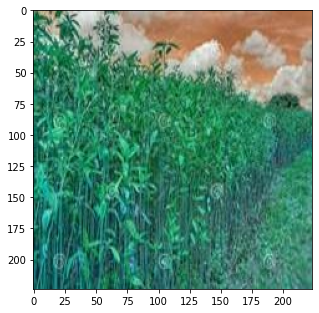

Type of the image :  <class 'numpy.ndarray'>
Shape of the given image : (224, 224, 3)
Image Hight 224
Image Width 224
Dimension of Image 3
Image size(ht*width*#of channels) : 150528
Maximum RGB value in this image : 255 
Minimum RGB value in this image : 0 


In [ ]:
idx_ = 100 # 100
image_analysis(df_jute.iloc[idx_]["path"],df_jute.iloc[idx_]["crop"])


<pre>
observation:
1. The displayed JUTE crop image in JPEG format
2. The given image in RGB format 
3. shape of the given image is (224,224,3) 
4. height of the given image is 224 , width of the given image is 224 , it contain 3 channels(red,green,blue)
5. pixel values are in the range(0-255)
</pre>

--------------------------------------------------------------------------------------------------JUTE--------------------------------------------------------------------------------------------------
pixel values at 150 row and 100 column.
Value of only R channel 50
Value of only G channel 104
Value of only B channel 91


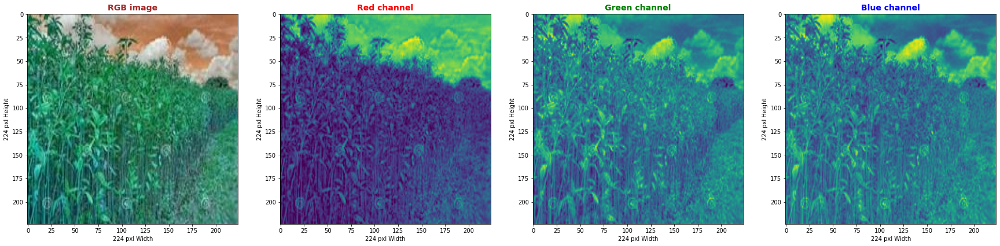

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:67: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


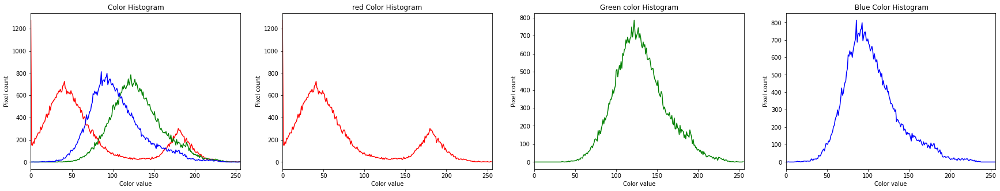

In [ ]:
row_px = 150 # value < image width(224)
col_px = 100 # value < image height(224)
image_pixel_analysis(df_jute.iloc[idx_]["path"],df_jute.iloc[idx_]["crop"],row_px,col_px)

<pre>
observation:
1. just eloborate the considered Jute crop image.
2. At the (150,100) cell contain the more green value than red and blue observe at color histogram. 
3. Just display the channels and their corresponding pixel values distribution.
4. most of the red pixel value is 50 (approx)
5. most of the green pixel value contains 100-200(approx)
6. most of the blue pixel vlaue contains 50-150(approx)

</pre>

--------------------------------------------------------------------------------------------------JUTE--------------------------------------------------------------------------------------------------
shape of the given image :  (224, 224, 3)


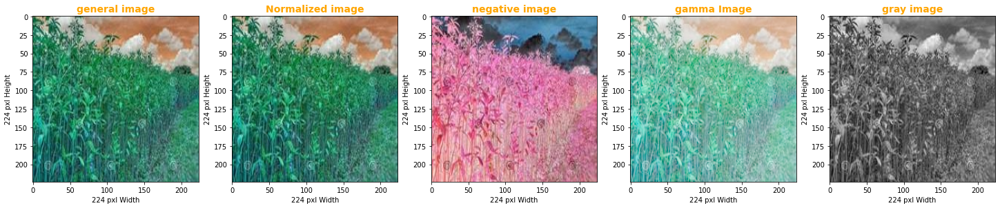

In [ ]:
transformations_image(df_jute.iloc[idx_]["path"],df_jute.iloc[idx_]["crop"])

<pre>
observation:
1. actually image is combinations of pixel values
2. so I am just change the pixel values and displayed those pixeled images how they looks like.
3. how thw image displayed after normalizing the pixel values(1/255) , negative(-255)...etc.
4. how the image is transformed based on changing the pixel values of the taken image.
</pre>

##### 3.3.1 Maize images analysis

 summarize the basic details of the image...
The format of the image :  JPEG
The size of the image :  (224, 224)
The mode of the image :  RGB
-------------------------------------------------------------------------------------------------MAIZE--------------------------------------------------------------------------------------------------


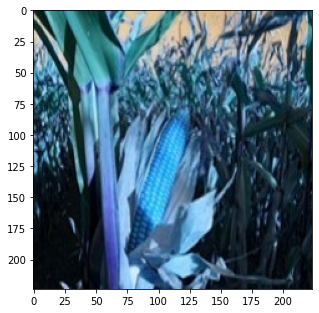

Type of the image :  <class 'numpy.ndarray'>
Shape of the given image : (224, 224, 3)
Image Hight 224
Image Width 224
Dimension of Image 3
Image size(ht*width*#of channels) : 150528
Maximum RGB value in this image : 255 
Minimum RGB value in this image : 0 


In [ ]:
idx_ = 4 #45
image_analysis(df_maize.iloc[idx_]["path"],df_maize.iloc[idx_]["crop"])


<pre>
observation:
1. The displayed MAIZE crop image in JPEG format
2. The given image in RGB mode 
3. shape of the given image is (224,224,3) 
4. height of the given image is 224 , width of the given image is 224 , it contain 3 channels(red,green,blue)
5. pixel values are in the range(0-255)
</pre>

-------------------------------------------------------------------------------------------------MAIZE--------------------------------------------------------------------------------------------------
pixel values at 150 row and 100 column.
Value of only R channel 66
Value of only G channel 202
Value of only B channel 250


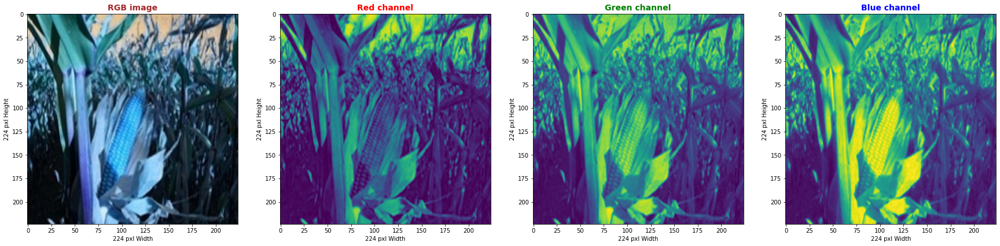

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:67: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


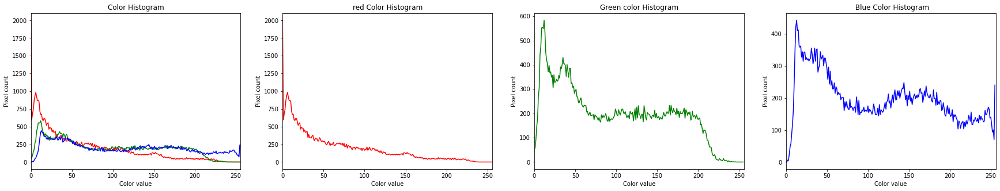

In [ ]:
row_px = 150 # value < image width(224)
col_px = 100 # value < image height(224)
image_pixel_analysis(df_maize.iloc[idx_]["path"],df_maize.iloc[idx_]["crop"],row_px,col_px)

<pre>
observation:
1. just eloborate the considered Jute crop image.
2. At the (150,100) cell contain the more blue value than red and green.
3. Just display the channels and their corresponding pixel values distribution.
4. most of the pixel values contain their value 0-10(approx) of the all channel values.
5. most of the red pixel values with 0 value.
6. most of the green pixel values within 0-50.
7. most of the blue values within 0-50.

</pre>

-------------------------------------------------------------------------------------------------MAIZE--------------------------------------------------------------------------------------------------
shape of the given image :  (224, 224, 3)


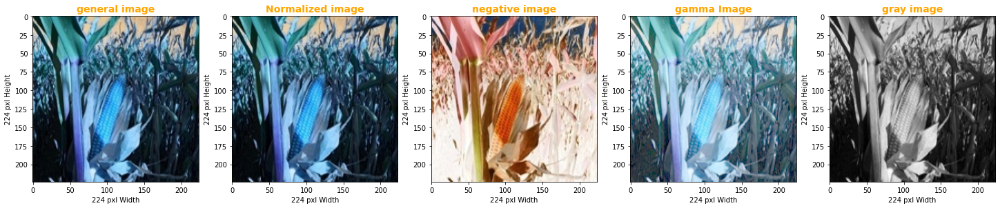

In [ ]:
transformations_image(df_maize.iloc[idx_]["path"],df_maize.iloc[idx_]["crop"])

<pre>
observation:
1. actually image is combinations of pixel values
2. so I am just change the pixel values and displayed those pixeled images how they looks like.
3. how thw image displayed after normalizing the pixel values(1/255) , negative(-255)...etc.
4. how the image is transformed based on changing the pixel values of the taken image.
</pre>

#####3.3.2 rice image analysis

 summarize the basic details of the image...
The format of the image :  JPEG
The size of the image :  (224, 224)
The mode of the image :  RGB
--------------------------------------------------------------------------------------------------RICE--------------------------------------------------------------------------------------------------


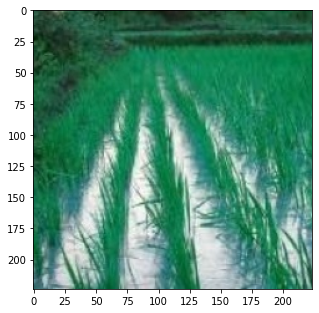

Type of the image :  <class 'numpy.ndarray'>
Shape of the given image : (224, 224, 3)
Image Hight 224
Image Width 224
Dimension of Image 3
Image size(ht*width*#of channels) : 150528
Maximum RGB value in this image : 255 
Minimum RGB value in this image : 0 


In [ ]:
idx_ = 17
image_analysis(df_rice.iloc[idx_]["path"],df_rice.iloc[idx_]["crop"])

<pre>
observation:
1. The displayed rice crop image in JPEG format
2. The given image in RGB mode 
3. shape of the given image is (224,224,3) 
4. height of the given image is 224 , width of the given image is 224 , it contain 3 channels(red,green,blue)
5. pixel values are in the range(0-255)
</pre>

--------------------------------------------------------------------------------------------------RICE--------------------------------------------------------------------------------------------------
pixel values at 150 row and 100 column.
Value of only R channel 39
Value of only G channel 189
Value of only B channel 130


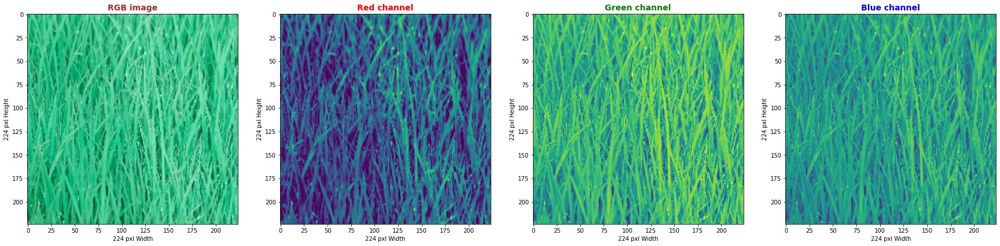

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:67: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


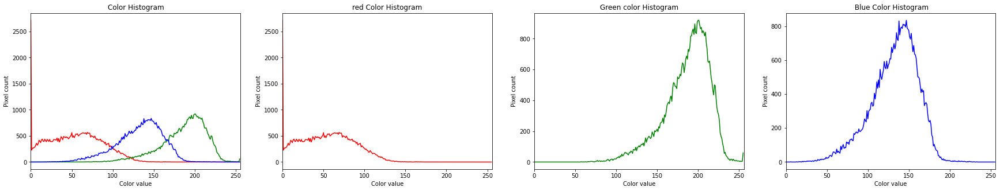

In [ ]:
row_px = 150 # value < image width(224)
col_px = 100 # value < image height(224)
image_pixel_analysis(df_rice.iloc[idx_]["path"],df_rice.iloc[idx_]["crop"],row_px,col_px)

<pre>
observation:
1. just eloborate the considered Sugarcane crop image.
2. At the (150,100) cell contain the high green value than red and green.
3. Just display the channels and their corresponding pixel values distribution.
4. most of the red pixel values with in the range (0-80) (approx)
5. most of the green pixel values with in the range(150-220)
6. most of the blue pixel values with in the range(100-180)
</pre>

--------------------------------------------------------------------------------------------------RICE--------------------------------------------------------------------------------------------------
shape of the given image :  (224, 224, 3)


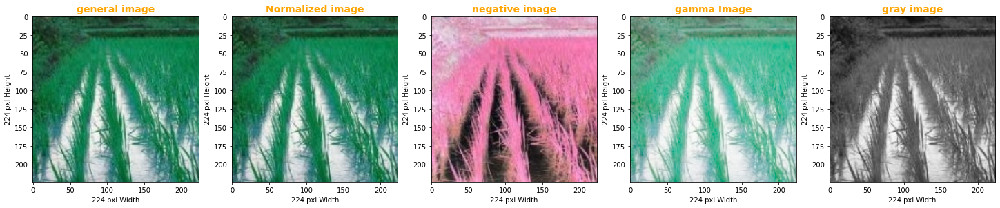

In [ ]:
transformations_image(df_rice.iloc[idx_]["path"],df_rice.iloc[idx_]["crop"])

<pre>
observation:
1. actually image is combinations of pixel values
2. so I am just change the pixel values and displayed those pixeled images how they looks like.
3. how thw image displayed after normalizing the pixel values(1/255) , negative(-255)...etc.
4. how the image is transformed based on changing the pixel values of the taken image.
</pre>

##### 3.3.3 sugarcane images analysis

 summarize the basic details of the image...
The format of the image :  JPEG
The size of the image :  (224, 224)
The mode of the image :  RGB
-----------------------------------------------------------------------------------------------SUGARCANE------------------------------------------------------------------------------------------------


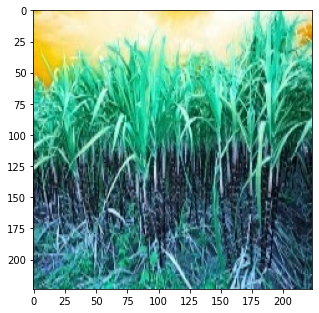

Type of the image :  <class 'numpy.ndarray'>
Shape of the given image : (224, 224, 3)
Image Hight 224
Image Width 224
Dimension of Image 3
Image size(ht*width*#of channels) : 150528
Maximum RGB value in this image : 255 
Minimum RGB value in this image : 0 


In [ ]:
idx_ = 100 # 11 
image_analysis(df_sugarcane.iloc[idx_]["path"],df_sugarcane.iloc[idx_]["crop"])

<pre>
observation:
1. The displayed Sugarcane crop image in JPEG format
2. The given image in RGB mode 
3. shape of the given image is (224,224,3) 
4. height of the given image is 224 , width of the given image is 224 , it contain 3 channels(red,green,blue)
5. pixel values are in the range(0-255)
</pre>

-----------------------------------------------------------------------------------------------SUGARCANE------------------------------------------------------------------------------------------------
pixel values at 150 row and 100 column.
Value of only R channel 88
Value of only G channel 115
Value of only B channel 136


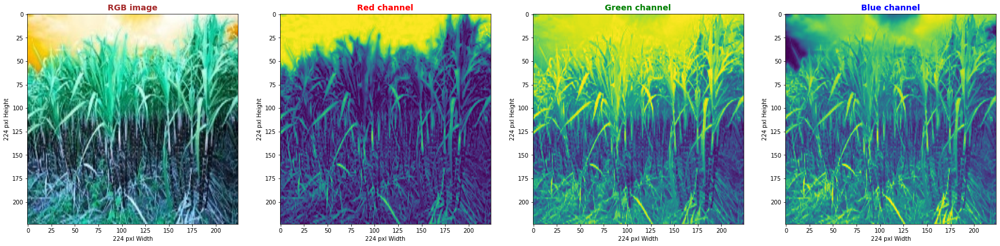

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:67: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


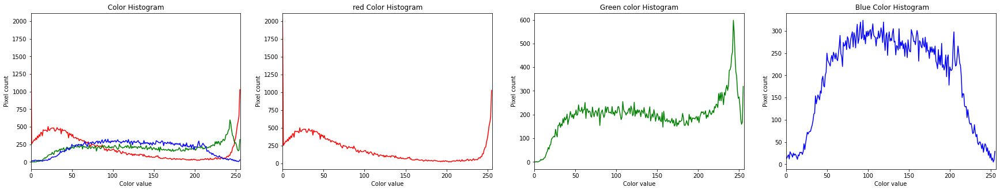

In [ ]:
row_px = 150 # value < image width(224)
col_px = 100 # value < image height(224)
image_pixel_analysis(df_sugarcane.iloc[idx_]["path"],df_sugarcane.iloc[idx_]["crop"],row_px,col_px)

<pre>
observation:
1. just eloborate the considered Sugarcane crop image.
2. At the (150,100) cell contain the high blue value than red and green.
3. Just display the channels and their corresponding pixel values distribution.
4. most of the red values contain 0, 255 values
5. most of the green pixel values contain 220-250 values.
6. most of the blue vlaues contain 80-210 (approx) 
</pre>

-----------------------------------------------------------------------------------------------SUGARCANE------------------------------------------------------------------------------------------------
shape of the given image :  (224, 224, 3)


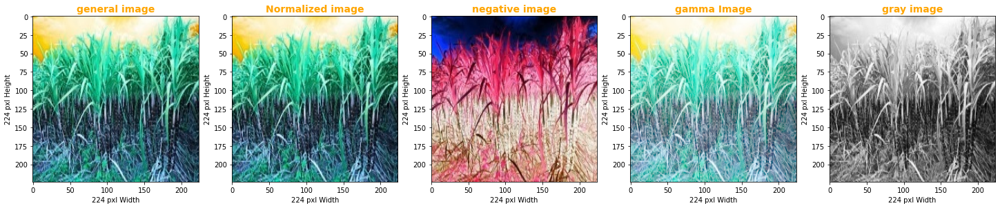

In [ ]:
transformations_image(df_sugarcane.iloc[idx_]["path"],df_sugarcane.iloc[idx_]["crop"])

<pre>
observation:
1. actually image is combinations of pixel values
2. so I am just change the pixel values and displayed those pixeled images how they looks like.
3. how thw image displayed after normalizing the pixel values(1/255) , negative(-255)...etc.
4. how the image is transformed based on changing the pixel values of the taken image.
</pre>

#####3.3.4 wheat images analysis

 summarize the basic details of the image...
The format of the image :  JPEG
The size of the image :  (224, 224)
The mode of the image :  RGB
-------------------------------------------------------------------------------------------------WHEAT--------------------------------------------------------------------------------------------------


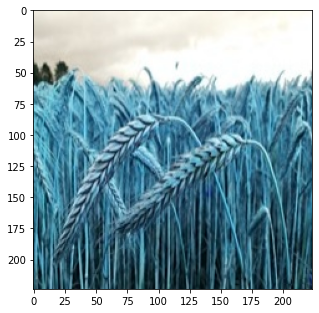

Type of the image :  <class 'numpy.ndarray'>
Shape of the given image : (224, 224, 3)
Image Hight 224
Image Width 224
Dimension of Image 3
Image size(ht*width*#of channels) : 150528
Maximum RGB value in this image : 255 
Minimum RGB value in this image : 0 


In [ ]:
idx_ = 13 #30 #10 
image_analysis(df_wheat.iloc[idx_]["path"],df_wheat.iloc[idx_]["crop"])


<pre>
observation:
1. The displayed wheat crop image in JPEG format
2. The given image in RGB mode 
3. shape of the given image is (224,224,3) 
4. height of the given image is 224 , width of the given image is 224 , it contain 3 channels(red,green,blue)
5. pixel values are in the range(0-255)
</pre>

-------------------------------------------------------------------------------------------------WHEAT--------------------------------------------------------------------------------------------------
pixel values at 150 row and 100 column.
Value of only R channel 64
Value of only G channel 118
Value of only B channel 141


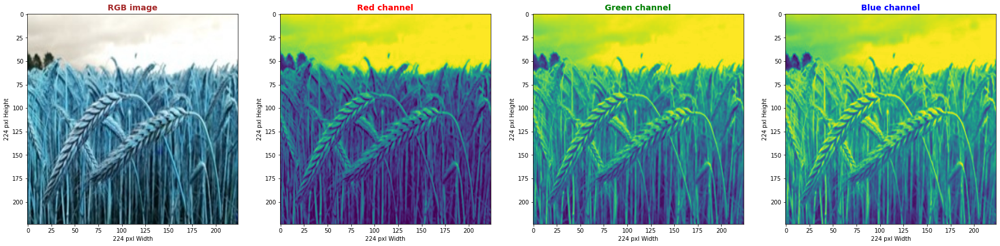

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:67: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


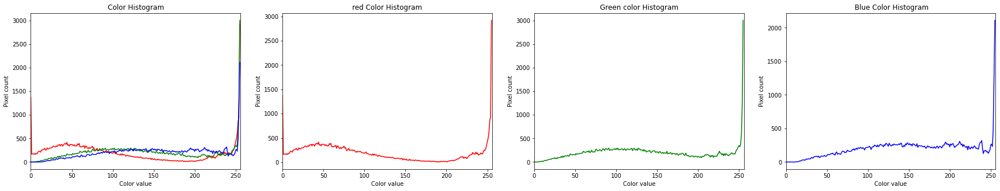

In [ ]:
row_px = 150 # value < image width(224)
col_px = 100 # value < image height(224)
image_pixel_analysis(df_wheat.iloc[idx_]["path"],df_wheat.iloc[idx_]["crop"],row_px,col_px)

<pre>
observation:
1. just eloborate the considered Sugarcane crop image.
2. At the (150,100) cell contain the high blue value than red and green.
3. Just display the channels and their corresponding pixel values distribution.
4. most of the red channel pixel containing 0,255 values .
5. most of the green channel containing 255 pixel value.
6. most of the blue channel containing 255 pixel value
</pre>

-------------------------------------------------------------------------------------------------WHEAT--------------------------------------------------------------------------------------------------
shape of the given image :  (224, 224, 3)


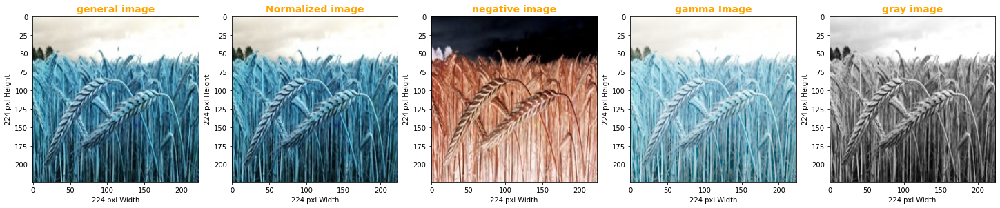

In [ ]:
transformations_image(df_wheat.iloc[idx_]["path"],df_wheat.iloc[idx_]["crop"])

<pre>
observation:
1. actually image is combinations of pixel values
2. so I am just change the pixel values and displayed those pixeled images how they looks like.
3. how thw image displayed after normalizing the pixel values(1/255) , negative(-255)...etc.
4. how the image is transformed based on changing the pixel values of the taken image.
</pre>

#### observation:

1. I have an 1000 images with 5 types of the crops.
2. all images are in the same format so no need to resize incase you required just perform  resizing.
3. shape of my images is (224,224,3)
4. all of the images are in RGB mode.
5. here I just observed when I am changing the pixel values then entire image displayed differently with same format.
6. analyzing how channels are distributed.
7. perform basic analysis on each type of the crop.

###4.data splitting

In [ ]:
# jute -0
# maize -1
# rice -2
# sugarcane-3
# wheat -4
from sklearn.model_selection import train_test_split
x = df["path"]
y = df["crop"]
#df1 = df[['path', 'croplabel']] # takes only the image and mask values
X_train, X_test,y_train,y_test = train_test_split(x,y,test_size=0.1, random_state=42,stratify=y)#dataset is less so takes the 90-10 ratio.
print("the shape of the train data : ",(X_train.shape,y_train.shape))
print("the shape of the test data : ",(X_test.shape,y_test.shape))

the shape of the train data :  ((899,), (899,))
the shape of the test data :  ((100,), (100,))


In [ ]:
def class_distribution(y_train,y_test):
  """
    this function just gives the distribution of the dataset based on the class labels of the target after splitting the data
  """
  # it returns a dict, keys as class labels and values as the number of data points in that class
  train_class_distribution = y_train.value_counts()
  test_class_distribution = y_test.value_counts()

  my_colors = ['#b23850', '#3b8beb','#e7e3d4', '#c4dbf6', '#8590aa']#, '#0d19a3', '#15db95', '#080f5b', '#f79e02']
  train_class_distribution.plot(kind='bar', color=my_colors)
  plt.xlabel('target')
  plt.ylabel('Data points per Class')
  plt.title('Distribution of yi in train data')
  plt.grid()
  plt.show()

  # ref: argsort https://docs.scipy.org/doc/numpy/reference/generated/numpy.argsort.html
  # -(train_class_distribution.values): the minus sign will give us in decreasing order
  sorted_yi = np.argsort(-train_class_distribution.values)
  for i in sorted_yi:
    print('Number of data points in class', i+1, ':',train_class_distribution.values[i], '(', np.round((train_class_distribution.values[i]/y_train.shape[0]*100), 3), '%)')

  print('-'*80)
  my_colors = ['#b23850', '#3b8beb', '#e7e3d4', '#c4dbf6', '#8590aa']#, '#0d19a3', '#15db95', '#080f5b', '#f79e02']
  test_class_distribution.plot(kind='bar', color=my_colors)
  plt.xlabel('Class')
  plt.ylabel('Data points per Class')
  plt.title('Distribution of yi in test data')
  plt.grid()
  plt.show()

  # ref: argsort https://docs.scipy.org/doc/numpy/reference/generated/numpy.argsort.html
  # -(train_class_distribution.values): the minus sign will give us in decreasing order
  sorted_yi = np.argsort(-test_class_distribution.values)
  for i in sorted_yi:
    print('Number of data points in class', i+1, ':',test_class_distribution.values[i], '(', np.round((test_class_distribution.values[i]/y_test.shape[0]*100), 3), '%)')


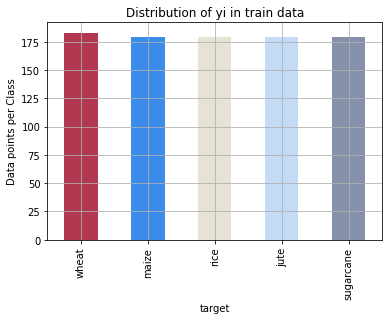

Number of data points in class 1 : 183 ( 20.356 %)
Number of data points in class 2 : 179 ( 19.911 %)
Number of data points in class 3 : 179 ( 19.911 %)
Number of data points in class 4 : 179 ( 19.911 %)
Number of data points in class 5 : 179 ( 19.911 %)
--------------------------------------------------------------------------------


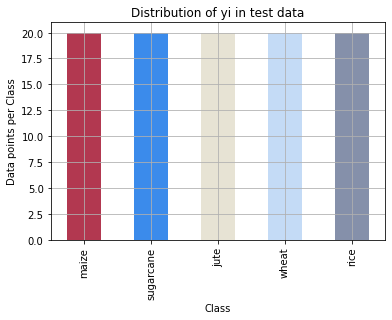

Number of data points in class 1 : 20 ( 20.0 %)
Number of data points in class 2 : 20 ( 20.0 %)
Number of data points in class 3 : 20 ( 20.0 %)
Number of data points in class 4 : 20 ( 20.0 %)
Number of data points in class 5 : 20 ( 20.0 %)


In [ ]:
class_distribution(y_train,y_test)

<pre>
observation:
1. all of the crops images are equally distributed 
</pre>

    LOSS FUNCTION:
    Cross-entropy is commonly used in machine learning as a loss function. Cross-entropy is a measure of the difference between two probability distributions for a given random variable or set of events.

    We have defined an accuracy function which calculates the overall accuracy of the model on an entire batch of outputs, so that we can use it as a metric in fit.

## roof

In [ ]:
df.iloc[0]

path         /kaggle/input/kag2/sugarcane/sugarcane037ahs.jpeg
crop                                                 sugarcane
croplabel                                                    3
Name: 0, dtype: object

In [ ]:
ip = "/kaggle/input/kag2/sugarcane/sugarcane037ahs.jpeg"

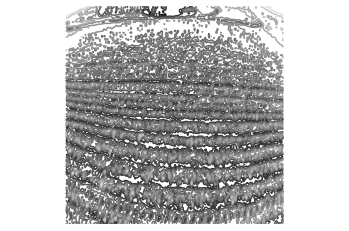

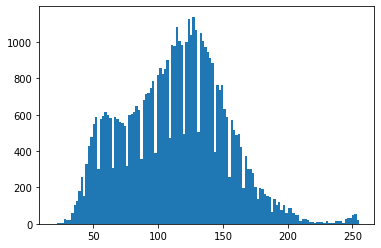

In [ ]:
from PIL import Image
from pylab import *

# read image to array
im = array(Image.open(ip).convert('L'))

# create a new figure
figure()
# don't use colors
gray()
# show contours with origin upper left corner
contour(im, origin='image')
axis('equal')
axis('off')
figure()
hist(im.flatten(),128)
show()

In [ ]:
# most of the pixels having b/w 100-150 

In [ ]:
# refer: https://www.oreilly.com/library/view/programming-computer-vision/9781449341916/ch01.html


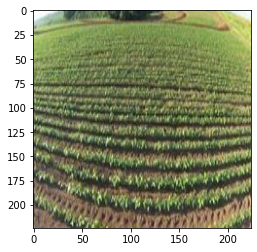

In [ ]:
import skimage
# read original image, in full color
image = skimage.io.imread(ip)

# display the image
fig, ax = plt.subplots()
plt.imshow(image)
plt.show()


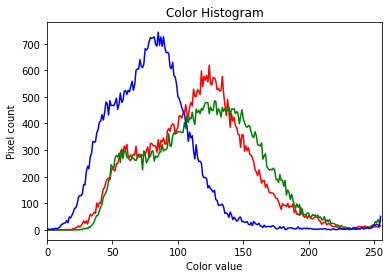

In [ ]:
# tuple to select colors of each channel line
colors = ("red", "green", "blue")
channel_ids = (0, 1, 2)

# create the histogram plot, with three lines, one for
# each color
plt.figure()
plt.xlim([0, 256])
for channel_id, c in zip(channel_ids, colors):
    histogram, bin_edges = np.histogram(
        image[:, :, channel_id], bins=256, range=(0, 256)
    )
    plt.plot(bin_edges[0:-1], histogram, color=c)

plt.title("Color Histogram")
plt.xlabel("Color value")
plt.ylabel("Pixel count")

plt.show()


In [ ]:
# roof:
"""
We can load images in grayscale by passing the as_gray=True parameter to the skimage.io.imread() function.

We can create histograms of images with the np.histogram function.

We can separate the RGB channels of an image using slicing operations.

We can display histograms using the matplotlib pyplot figure(), title(), xlabel(), ylabel(), xlim(), plot(), and show() functions.

"""

In [ ]:
# basic reference how the image classification works on the images
# refer: https://www.analyticsvidhya.com/blog/2020/02/learn-image-classification-cnn-convolutional-neural-networks-3-datasets/
# agriculture robots: https://builtin.com/robotics/farming-agricultural-robots
# basic/first cut solution: https://www.kaggle.com/aman2000jaiswal/vggmodel-for-agriculture-crop-image-classification
# different agriculture problems solved by AI:
# refer: https://www.researchgate.net/publication/349444668_Review_on_Crop_Prediction_Using_Deep_Learning_Techniques

# data(image) preprocessing : https://blog.jovian.ai/image-classification-with-cifar100-deep-learning-using-pytorch-9d9211a696e


# evaluation metrics on multi classification problem: 
# refer: https://towardsdatascience.com/comprehensive-guide-on-multiclass-classification-metrics-af94cfb83fbd
# brief about confusion metrics: https://www.analyticsvidhya.com/blog/2020/04/confusion-matrix-machine-learning/


In [ ]:
#Feature Engineering:
# refer:https://towardsdatascience.com/fast-feature-engineering-in-python-image-data-5d3a8a7bf616

# imagedata classification models:
# refer : https://www.analyticsvidhya.com/blog/2020/08/top-4-pre-trained-models-for-image-classification-with-python-code/

# how to load the dataset from images path and how to use pre trained models
# refer: https://www.simplilearn.com/tutorials/deep-learning-tutorial/guide-to-building-powerful-keras-image-classification-models


In [ ]:
# refer: https://www.pluralsight.com/guides/importing-image-data-into-numpy-arrays
# more pixel statistics: https://www.kdnuggets.com/2018/07/basic-image-data-analysis-numpy-opencv-p1.html


def image_analysis(image_path):
  im = Image.open(image_path)
  print(" summarize the basic details of the image...")
  print("="*50)
  print("The format of the image : ",im.format)
  print("The size of the image : ",im.size)
  print("The mode of the image : ",im.mode)

  print('Type of the image : ',type(im))
  print()
  print('Shape of the image : {}'.format(im.shape))
  print('Image Hight {}'.format(im.shape[0]))
  print('Image Width {}'.format(im.shape[1]))
  print('Dimension of Image {}'.format(im.ndim))
  #print("The shape of the image : ",im.shape)
  plt.imshow(im)
  plt.show()

  # load the image and convert into numpy array
  numpydata = asarray(im)
  #print(type(numpydata))
  #  shape
  print("shape of the image array",numpydata.shape)
  return None

In [ ]:
image_analysis(ip)

 summarize the basic details of the image...
The format of the image :  JPEG
The size of the image :  (224, 224)
The mode of the image :  RGB
Type of the image :  <class 'PIL.JpegImagePlugin.JpegImageFile'>



AttributeError: ignored

---------------------------------------------sugarcane----------------------------------------------
shape of the given image :  (224, 224, 3)


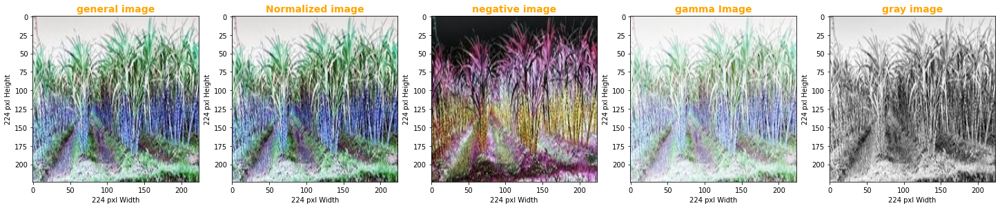

In [ ]:
transformations_image(df.iloc[800]["path"],df.iloc[800]["crop"]) # 200,0,400,600,800